# Vehicle detection model paramter exploration


In [35]:
import numpy as np
import cv2
import glob
import random
import time
from random import shuffle
from skimage.feature import hog
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.svm import LinearSVC
from sklearn import tree
from sklearn.metrics import accuracy_score
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
import math
from skimage import exposure
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import pickle
import cv2
from moviepy.editor import VideoFileClip
from IPython.display import HTML
random.seed(23)

In [2]:
img_car = glob.glob("vehicles/vehicles/*/*.*")
img_noCar = glob.glob("non-vehicles/non-vehicles/*/*.*")


In [3]:
imgCars =  []

for i in range(len(img_car)):
    imgCars.append(cv2.imread(img_car[i]))


In [4]:
imgNoCars =  []

for i in range(len(img_noCar)):
    imgNoCars.append(cv2.imread(img_noCar[i]))

In [5]:
print ('Car Data: ')
print ('total Car images',len(imgCars))
print ('Car images size', imgCars[random.randint(1, len(imgCars))].shape)
print ('Car images data type', imgCars[random.randint(1, len(imgCars))].dtype)
print ('\nNon Car Data: ')
print ('total non car images',len(imgNoCars))
print ('Non car images size', imgNoCars[random.randint(1, len(imgNoCars))].shape)
print ('Non car images data type', imgNoCars[random.randint(1, len(imgNoCars))].dtype)



Car Data: 
total Car images 8814
Car images size (64, 64, 3)
Car images data type uint8

Non Car Data: 
total non car images 8984
Non car images size (64, 64, 3)
Non car images data type uint8


In [6]:
def compare_images5(img1, img2, img3, img4,img5, text1 = 'img1', text2 = 'img2', text3 = 'img3', text4 = 'img4', text5 = 'img5'):
    f, (ax1, ax2,ax3,ax4, ax5) = plt.subplots(1, 5, figsize=(48, 18))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title(text1, fontsize=40)
    ax2.imshow(img2)
    ax2.set_title(text2, fontsize=40)
    ax3.imshow(img3)
    ax3.set_title(text3, fontsize=40)
    ax4.imshow(img4)
    ax4.set_title(text4, fontsize=40)
    ax5.imshow(img5)
    ax5.set_title(text5, fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [7]:
def compare_images(img1, img2, text1 = 'img1', text2 = 'img2'):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(48, 18))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title(text1, fontsize=40)
    ax2.imshow(img2)
    ax2.set_title(text2, fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



In [10]:
def convert_color(img, conv='BGR2RGB'):
    #print ('converting ')
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    if conv == 'BGR2LUV':
        return cv2.cvtColor(img, cv2.COLOR_BGR2LUV)
    if conv == 'RGB2YUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    if conv == 'BGR2YUV':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    if conv == 'RGB2HSV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    if conv == 'BGR2HSV':
        return cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    if conv == 'RGB2HLS':
        return cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    if conv == 'BGR2HLS':
        return cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    if conv == 'BGR2RGB':
        return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    else:
        return img

def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    #print ('get hog: ')
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block),
                                  block_norm= 'L2-Hys',
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block),
                       block_norm= 'L2-Hys',
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        return features

def bin_spatial(img, size=(32, 32)):
    #print ('binning: ')
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))
                        
def color_hist(img, nbins=32, bins_range=(0, 256), vis = False):
    #print ('histogramming: ')
    # Compute the histogram of the RGB channels separately

    # Take histograms in R, G, and B
    r,g,b = cv2.split(img)
    
    rhist = np.histogram(r, bins = nbins, range=bins_range)[0]
    ghist = np.histogram(g, bins = nbins, range=bins_range)[0]
    bhist = np.histogram(b, bins = nbins, range=bins_range)[0]
    # Generating bin centers
    bin_edges = np.histogram(r, bins = nbins, range=bins_range)[1]
    bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])//2
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((rhist, ghist, bhist))

    # Return the individual histograms, bin_centers and feature vector
  
    if vis == True:
        
        return rhist, ghist, bhist, bin_centers, hist_features
        
    else:
        return hist_features


In [11]:
def extract_features(imgs, orient, pix_per_cell, cell_per_block, cspace='RGB', spatial_size=(32, 32),
                        hist_bins=32, hist_range=(0, 256), hog_channels = 3,  
                        vis1=False):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    c_space = 'RGB2' + cspace
    #print ('c space: ', c_space)
    colr_conv = 0
    binning_time = 0
    hog_time = 0
    histo_time = 0
    for img in imgs:
        
        # Read in each one by one
        image = mpimg.imread(img)
        t=time.time()
        image = convert_color(image, c_space)
        t2 = time.time()
        colr_conv = colr_conv + (t2-t)
        
        # Apply bin_spatial() to get spatial color features
        t3 = time.time()
        bin_features = bin_spatial(image)
        t4 = time.time()
        binning_time = binning_time + (t4-t3)
        # Apply color_hist() to get color histogram features
        t8 = time.time()
        hist_features = color_hist(image, nbins=32, bins_range=(0, 256))
        t9 = time.time()
        histo_time = histo_time+(t9 - t8)
        # Append the new feature vector to the features list
        
        #append hog features
        t5 = time.time()
        if 3 == hog_channels:
            #print ('hog_channels: ', hog_channels)
            hogF = []
            for i in range(3):
                hogF1 = get_hog_features(image[:,:,i], orient, pix_per_cell, cell_per_block, 
                        vis = False, feature_vec=True)
                hogF.append(hogF1)
            hog_features = np.ravel(hogF)
        
        elif hog_channels < 3:
            #print ('hog_channels less : ', hog_channels)
            hog_features = get_hog_features(image[:,:,hog_channels], orient, pix_per_cell, cell_per_block, 
                        vis= False, feature_vec=True)
        t6 = time.time()
        hog_time = hog_time + (t6 - t5)
        feats = np.concatenate((bin_features, hist_features, hog_features))
        
        features.append(feats)
    # Return list of feature vectors
    print ('colr_conv time = ', round(colr_conv,3), 'binning_time= ', round(binning_time,3), 'hog_time= ', round(hog_time,3), 'histo_time= ', round(histo_time,3))
    return features

In [36]:

cspaces = {'YUV', 'HSV', 'LAB', 'YCrCb', 'HLS'}
for cspace1 in cspaces:
    print ('Color Space is: ', cspace1, '. HOG for all channels')
    non_car_features = extract_features(img_noCar, 9, pix_per_cell = 8, cell_per_block = 2, cspace = cspace1, spatial_size=(32, 32),
                            hist_bins=32, hist_range=(0, 256), hog_channels = 3,  vis1=False)
    car_features = extract_features(img_car, 9, pix_per_cell = 8, cell_per_block = 2, cspace =cspace1, spatial_size=(32, 32),
                            hist_bins=32, hist_range=(0, 256), hog_channels = 3,  vis1=False)
    #shuffle(non_car_features)
    #shuffle(car_features)
    X = np.vstack((car_features, non_car_features)).astype(np.float64)

    y = np.hstack((np.ones(len(car_features)), np.zeros(len(non_car_features))))
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=random.randint(1,len(img_noCar)))
    X_scaler = StandardScaler().fit(X_train)
    # Apply the scaler to X
    X_train = X_scaler.transform(X_train)
    X_test = X_scaler.transform(X_test)

    svc = LinearSVC()
    # Check the training time for the SVC
    t=time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to train SVC...')
    # Check the score of the SVC

    # Check the prediction time for a single sample
    t=time.time()
    acc_svc = round(svc.score(X_test, y_test), 4)
    t2 = time.time()
    print('Test Accuracy of SVC = ', acc_svc)
    print(round(t2-t, 5)/len(y_test), 'average Seconds to test 1 image on MLP')
    
    #MPL--------------
    clf = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), random_state=1)
    t3=time.time()
    clf.fit(X_train, y_train)
    t4 = time.time()
    print(round(t4-t3, 2), 'Seconds to train MLP...')

    t5=time.time()
    y_pred = clf.predict(X_test)
    t6 = time.time()
    print(round(t6-t5, 2)/len(y_test), 'average Seconds to test 1 image on MLP')
    print ('MLP test accuracy: ', accuracy_score(y_test, y_pred))
    print('==========================================================\n')


Color Space is:  YUV . HOG for all channels
colr_conv time =  0.192 binning_time=  0.424 hog_time=  44.589 histo_time=  5.202
colr_conv time =  0.218 binning_time=  0.408 hog_time=  43.91 histo_time=  5.128
23.41 Seconds to train SVC...
Test Accuracy of SVC =  0.9816
1.4092611508341846e-05 average Seconds to test 1 image on MLP
4.13 Seconds to train MLP...
1.5321756894790602e-05 average Seconds to test 1 image on MLP
MLP test accuracy:  0.986550902281

Color Space is:  HSV . HOG for all channels
colr_conv time =  0.643 binning_time=  0.35 hog_time=  42.634 histo_time=  4.691
colr_conv time =  0.487 binning_time=  0.36 hog_time=  42.226 histo_time=  4.637
23.75 Seconds to train SVC...
Test Accuracy of SVC =  0.9823
1.782601293837249e-05 average Seconds to test 1 image on MLP
4.12 Seconds to train MLP...
1.5321756894790602e-05 average Seconds to test 1 image on MLP
MLP test accuracy:  0.987402110998

Color Space is:  HLS . HOG for all channels
colr_conv time =  0.266 binning_time=  0.348

ValueError: too many values to unpack (expected 3)

In [38]:

cspaces = { 'YCrCb'}
for cspace1 in cspaces:
    print ('Color Space is: ', cspace1, '. HOG for all channels')
    non_car_features = extract_features(img_noCar, 9, pix_per_cell = 8, cell_per_block = 2, cspace = cspace1, spatial_size=(32, 32),
                            hist_bins=32, hist_range=(0, 256), hog_channels = 3,  vis1=False)
    car_features = extract_features(img_car, 9, pix_per_cell = 8, cell_per_block = 2, cspace =cspace1, spatial_size=(32, 32),
                            hist_bins=32, hist_range=(0, 256), hog_channels = 3,  vis1=False)
    #shuffle(non_car_features)
    #shuffle(car_features)
    X = np.vstack((car_features, non_car_features)).astype(np.float64)

    y = np.hstack((np.ones(len(car_features)), np.zeros(len(non_car_features))))
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=random.randint(1,len(img_noCar)))
    X_scaler = StandardScaler().fit(X_train)
    # Apply the scaler to X
    X_train = X_scaler.transform(X_train)
    X_test = X_scaler.transform(X_test)

    svc = LinearSVC()
    # Check the training time for the SVC
    t=time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to train SVC...')
    # Check the score of the SVC

    # Check the prediction time for a single sample
    t=time.time()
    acc_svc = round(svc.score(X_test, y_test), 4)
    t2 = time.time()
    print('Test Accuracy of SVC = ', acc_svc)
    print(round(t2-t, 5)/len(y_test), 'average Seconds to test 1 image on MLP')
    
    #MPL--------------
    clf = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), random_state=1)
    t3=time.time()
    clf.fit(X_train, y_train)
    t4 = time.time()
    print(round(t4-t3, 2), 'Seconds to train MLP...')

    t5=time.time()
    y_pred = clf.predict(X_test)
    t6 = time.time()
    print(round(t6-t5, 2)/len(y_test), 'average Seconds to test 1 image on MLP')
    print ('MLP test accuracy: ', accuracy_score(y_test, y_pred))
    print('==========================================================\n')


Color Space is:  YCrCb . HOG for all channels
colr_conv time =  0.198 binning_time=  0.403 hog_time=  44.597 histo_time=  5.309
colr_conv time =  0.186 binning_time=  0.413 hog_time=  44.926 histo_time=  5.408
24.6 Seconds to train SVC...
Test Accuracy of SVC =  0.9811
1.4261150834184541e-05 average Seconds to test 1 image on MLP
4.86 Seconds to train MLP...
1.5321756894790602e-05 average Seconds to test 1 image on MLP
MLP test accuracy:  0.987912836227



In [40]:

cspaces = {'YUV', 'HSV',  'YCrCb', 'HLS'}
channel = 0
for cspace1 in cspaces:
    print ('Color Space is: ', cspace1, '. HOG for ', cspace1[channel], ' channel')
    non_car_features = extract_features(img_noCar, 9, pix_per_cell = 8, cell_per_block = 2, cspace = cspace1, spatial_size=(32, 32),
                            hist_bins=32, hist_range=(0, 256), hog_channels = channel,  vis1=False)
    car_features = extract_features(img_car, 9, pix_per_cell = 8, cell_per_block = 2, cspace =cspace1, spatial_size=(32, 32),
                            hist_bins=32, hist_range=(0, 256), hog_channels = channel,  vis1=False)
    #shuffle(non_car_features)
    #shuffle(car_features)
    X = np.vstack((car_features, non_car_features)).astype(np.float64)

    y = np.hstack((np.ones(len(car_features)), np.zeros(len(non_car_features))))
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=random.randint(1,len(img_noCar)))
    X_scaler = StandardScaler().fit(X_train)
    # Apply the scaler to X
    X_train = X_scaler.transform(X_train)
    X_test = X_scaler.transform(X_test)

    svc = LinearSVC()
    # Check the training time for the SVC
    t=time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to train SVC...')
    # Check the score of the SVC

    # Check the prediction time for a single sample
    t=time.time()
    acc_svc = round(svc.score(X_test, y_test), 4)
    t2 = time.time()
    print('Test Accuracy of SVC = ', acc_svc)
    print(round(t2-t, 5)/len(y_test), 'average Seconds to test 1 image on SVC')
    
    #MPL--------------
    clf = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), random_state=1)
    t3=time.time()
    clf.fit(X_train, y_train)
    t4 = time.time()
    print(round(t4-t3, 2), 'Seconds to train MLP...')

    t5=time.time()
    y_pred = clf.predict(X_test)
    t6 = time.time()
    print(round(t6-t5, 2)/len(y_test), 'average Seconds to test 1 image on MLP')
    print ('MLP test accuracy: ', accuracy_score(y_test, y_pred))
    print('==========================================================\n')


Color Space is:  YUV . HOG for  Y  channel
colr_conv time =  0.352 binning_time=  0.392 hog_time=  15.387 histo_time=  6.776
colr_conv time =  0.289 binning_time=  0.376 hog_time=  14.712 histo_time=  6.436
20.01 Seconds to train SVC...
Test Accuracy of SVC =  0.9522
1.1205311542390195e-05 average Seconds to test 1 image on SVC
11.17 Seconds to train MLP...
1.0214504596527067e-05 average Seconds to test 1 image on MLP
MLP test accuracy:  0.975485188968

Color Space is:  HSV . HOG for  H  channel
colr_conv time =  0.643 binning_time=  0.353 hog_time=  14.791 histo_time=  6.023
colr_conv time =  0.556 binning_time=  0.373 hog_time=  14.347 histo_time=  5.529
16.89 Seconds to train SVC...
Test Accuracy of SVC =  0.9666
8.694245829077289e-06 average Seconds to test 1 image on SVC
13.57 Seconds to train MLP...
8.512087163772557e-06 average Seconds to test 1 image on MLP
MLP test accuracy:  0.979060265577

Color Space is:  HLS . HOG for  H  channel
colr_conv time =  0.394 binning_time=  0.33

In [41]:

cspaces = {'YUV', 'HSV',  'YCrCb', 'HLS'}
channel = 1
for cspace1 in cspaces:
    print ('Color Space is: ', cspace1, '. HOG for ', cspace1[channel], ' channel')
    non_car_features = extract_features(img_noCar, 9, pix_per_cell = 8, cell_per_block = 2, cspace = cspace1, spatial_size=(32, 32),
                            hist_bins=32, hist_range=(0, 256), hog_channels = channel,  vis1=False)
    car_features = extract_features(img_car, 9, pix_per_cell = 8, cell_per_block = 2, cspace =cspace1, spatial_size=(32, 32),
                            hist_bins=32, hist_range=(0, 256), hog_channels = channel,  vis1=False)
    #shuffle(non_car_features)
    #shuffle(car_features)
    X = np.vstack((car_features, non_car_features)).astype(np.float64)

    y = np.hstack((np.ones(len(car_features)), np.zeros(len(non_car_features))))
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=random.randint(1,len(img_noCar)))
    X_scaler = StandardScaler().fit(X_train)
    # Apply the scaler to X
    X_train = X_scaler.transform(X_train)
    X_test = X_scaler.transform(X_test)

    svc = LinearSVC()
    # Check the training time for the SVC
    t=time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to train SVC...')
    # Check the score of the SVC

    # Check the prediction time for a single sample
    t=time.time()
    acc_svc = round(svc.score(X_test, y_test), 4)
    t2 = time.time()
    print('Test Accuracy of SVC = ', acc_svc)
    print(round(t2-t, 5)/len(y_test), 'average Seconds to test 1 image on SVC')
    
    #MPL--------------
    clf = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), random_state=1)
    t3=time.time()
    clf.fit(X_train, y_train)
    t4 = time.time()
    print(round(t4-t3, 2), 'Seconds to train MLP...')

    t5=time.time()
    y_pred = clf.predict(X_test)
    t6 = time.time()
    print(round(t6-t5, 2)/len(y_test), 'average Seconds to test 1 image on MLP')
    print ('MLP test accuracy: ', accuracy_score(y_test, y_pred))
    print('==========================================================\n')


Color Space is:  YUV . HOG for  U  channel
colr_conv time =  0.338 binning_time=  0.333 hog_time=  14.88 histo_time=  7.041
colr_conv time =  0.279 binning_time=  0.356 hog_time=  14.745 histo_time=  6.931
20.8 Seconds to train SVC...
Test Accuracy of SVC =  0.9518
8.828736806264897e-06 average Seconds to test 1 image on SVC
13.32 Seconds to train MLP...
1.0214504596527067e-05 average Seconds to test 1 image on MLP
MLP test accuracy:  0.974633980252

Color Space is:  HSV . HOG for  S  channel
colr_conv time =  0.647 binning_time=  0.336 hog_time=  15.114 histo_time=  6.287
colr_conv time =  0.574 binning_time=  0.372 hog_time=  14.779 histo_time=  5.708
17.09 Seconds to train SVC...
Test Accuracy of SVC =  0.9661
8.489955737146748e-06 average Seconds to test 1 image on SVC
13.57 Seconds to train MLP...
8.512087163772557e-06 average Seconds to test 1 image on MLP
MLP test accuracy:  0.979570990807

Color Space is:  HLS . HOG for  L  channel
colr_conv time =  0.438 binning_time=  0.417 h

In [42]:

cspaces = {'YUV', 'HSV',  'YCrCb', 'HLS'}
channel = 2
for cspace1 in cspaces:
    print ('Color Space is: ', cspace1, '. HOG for ', cspace1[channel], ' channel')
    non_car_features = extract_features(img_noCar, 9, pix_per_cell = 8, cell_per_block = 2, cspace = cspace1, spatial_size=(32, 32),
                            hist_bins=32, hist_range=(0, 256), hog_channels = channel,  vis1=False)
    car_features = extract_features(img_car, 9, pix_per_cell = 8, cell_per_block = 2, cspace =cspace1, spatial_size=(32, 32),
                            hist_bins=32, hist_range=(0, 256), hog_channels = channel,  vis1=False)
    #shuffle(non_car_features)
    #shuffle(car_features)
    X = np.vstack((car_features, non_car_features)).astype(np.float64)

    y = np.hstack((np.ones(len(car_features)), np.zeros(len(non_car_features))))
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=random.randint(1,len(img_noCar)))
    X_scaler = StandardScaler().fit(X_train)
    # Apply the scaler to X
    X_train = X_scaler.transform(X_train)
    X_test = X_scaler.transform(X_test)

    svc = LinearSVC()
    # Check the training time for the SVC
    t=time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to train SVC...')
    # Check the score of the SVC

    # Check the prediction time for a single sample
    t=time.time()
    acc_svc = round(svc.score(X_test, y_test), 4)
    t2 = time.time()
    print('Test Accuracy of SVC = ', acc_svc)
    print(round(t2-t, 5)/len(y_test), 'average Seconds to test 1 image on SVC')
    
    #MPL--------------
    clf = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), random_state=1)
    t3=time.time()
    clf.fit(X_train, y_train)
    t4 = time.time()
    print(round(t4-t3, 2), 'Seconds to train MLP...')

    t5=time.time()
    y_pred = clf.predict(X_test)
    t6 = time.time()
    print(round(t6-t5, 2)/len(y_test), 'average Seconds to test 1 image on MLP')
    print ('MLP test accuracy: ', accuracy_score(y_test, y_pred))
    print('==========================================================\n')


Color Space is:  YUV . HOG for  V  channel
colr_conv time =  0.367 binning_time=  0.411 hog_time=  15.767 histo_time=  7.493
colr_conv time =  0.363 binning_time=  0.409 hog_time=  15.699 histo_time=  7.781
18.16 Seconds to train SVC...
Test Accuracy of SVC =  0.9605
7.810691181477698e-06 average Seconds to test 1 image on SVC
14.31 Seconds to train MLP...
8.512087163772557e-06 average Seconds to test 1 image on MLP
MLP test accuracy:  0.977868573374

Color Space is:  HSV . HOG for  V  channel
colr_conv time =  0.722 binning_time=  0.397 hog_time=  16.169 histo_time=  7.187
colr_conv time =  0.655 binning_time=  0.397 hog_time=  15.472 histo_time=  6.163
19.76 Seconds to train SVC...
Test Accuracy of SVC =  0.9576
7.640449438202247e-06 average Seconds to test 1 image on SVC
10.16 Seconds to train MLP...
1.0214504596527067e-05 average Seconds to test 1 image on MLP
MLP test accuracy:  0.974123255022

Color Space is:  HLS . HOG for  S  channel
colr_conv time =  0.467 binning_time=  0.411

In [43]:
cspaces = {'YUV', 'HSV',  'YCrCb', 'HLS'}
#cspaces = {'YCrCb'}
channel = 3
for cspace1 in cspaces:
    print ('Color Space is: ', cspace1, '. HOG for 3 channel')
    non_car_features = extract_features(img_noCar, 32, pix_per_cell = 16, cell_per_block = 2, cspace = cspace1, spatial_size=(32, 32),
                            hist_bins=32, hist_range=(0, 256), hog_channels = channel,  vis1=False)
    car_features = extract_features(img_car, 32, pix_per_cell = 16, cell_per_block = 2, cspace =cspace1, spatial_size=(32, 32),
                            hist_bins=32, hist_range=(0, 256), hog_channels = channel,  vis1=False)
    #shuffle(non_car_features)
    #shuffle(car_features)
    X = np.vstack((car_features, non_car_features)).astype(np.float64)

    y = np.hstack((np.ones(len(car_features)), np.zeros(len(non_car_features))))
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=random.randint(3, 255))
    #X_scaler = StandardScaler().fit(X_train)
                                                        
    # Apply the scaler to X RobustScaler()
    X_scaler = RobustScaler().fit(X_train)                                                   
    X_train = X_scaler.transform(X_train)
    X_test = X_scaler.transform(X_test)

    svc = LinearSVC()
    # Check the training time for the SVC
    t=time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to train SVC...')
    # Check the score of the SVC

    # Check the prediction time for a single sample
    t=time.time()
    acc_svc = round(svc.score(X_test, y_test), 4)
    t2 = time.time()
    print('Test Accuracy of SVC = ', acc_svc)
    print(round(t2-t, 5)/len(y_test), 'average Seconds to test 1 image on SVC')
    
    #MPL--------------
    clf = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), random_state=1)
    t3=time.time()
    clf.fit(X_train, y_train)
    t4 = time.time()
    print(round(t4-t3, 2), 'Seconds to train MLP...')

    t5=time.time()
    y_pred = clf.predict(X_test)
    t6 = time.time()
    print(round(t6-t5, 2)/len(y_test), 'average Seconds to test 1 image on MLP')
    print ('MLP test accuracy: ', accuracy_score(y_test, y_pred))
    print('==========================================================\n')

Color Space is:  YUV . HOG for 3 channel
colr_conv time =  0.688 binning_time=  0.439 hog_time=  37.103 histo_time=  7.609
colr_conv time =  0.616 binning_time=  0.406 hog_time=  35.687 histo_time=  7.212
21.84 Seconds to train SVC...
Test Accuracy of SVC =  0.9848
1.0365168539325843e-05 average Seconds to test 1 image on SVC
5.51 Seconds to train MLP...
1.1235955056179776e-05 average Seconds to test 1 image on MLP
MLP test accuracy:  0.98904494382

Color Space is:  HSV . HOG for 3 channel
colr_conv time =  1.0 binning_time=  0.395 hog_time=  36.279 histo_time=  6.277
colr_conv time =  0.765 binning_time=  0.424 hog_time=  36.022 histo_time=  6.03
19.67 Seconds to train SVC...
Test Accuracy of SVC =  0.9896
1.1202247191011235e-05 average Seconds to test 1 image on SVC
6.14 Seconds to train MLP...
1.1235955056179776e-05 average Seconds to test 1 image on MLP
MLP test accuracy:  0.992415730337

Color Space is:  HLS . HOG for 3 channel
colr_conv time =  0.479 binning_time=  0.423 hog_time

In [44]:
cspaces = {'YUV', 'HSV',  'YCrCb', 'HLS'}
#cspaces = {'YCrCb'}
channel = 3
for cspace1 in cspaces:
    print ('Color Space is: ', cspace1, '. HOG for 3 channel')
    non_car_features = extract_features(img_noCar, 16, pix_per_cell = 16, cell_per_block = 2, cspace = cspace1, spatial_size=(32, 32),
                            hist_bins=32, hist_range=(0, 256), hog_channels = channel,  vis1=False)
    car_features = extract_features(img_car, 16, pix_per_cell = 16, cell_per_block = 2, cspace =cspace1, spatial_size=(32, 32),
                            hist_bins=32, hist_range=(0, 256), hog_channels = channel,  vis1=False)
    #shuffle(non_car_features)
    #shuffle(car_features)
    X = np.vstack((car_features, non_car_features)).astype(np.float64)

    y = np.hstack((np.ones(len(car_features)), np.zeros(len(non_car_features))))
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=random.randint(3, 255))
    #X_scaler = StandardScaler().fit(X_train)
                                                        
    # Apply the scaler to X RobustScaler()
    X_scaler = RobustScaler().fit(X_train)                                                   
    X_train = X_scaler.transform(X_train)
    X_test = X_scaler.transform(X_test)

    svc = LinearSVC()
    # Check the training time for the SVC
    t=time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to train SVC...')
    # Check the score of the SVC

    # Check the prediction time for a single sample
    t=time.time()
    acc_svc = round(svc.score(X_test, y_test), 4)
    t2 = time.time()
    print('Test Accuracy of SVC = ', acc_svc)
    print(round(t2-t, 5)/len(y_test), 'average Seconds to test 1 image on SVC')
    
    #MPL--------------
    clf = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), random_state=1)
    t3=time.time()
    clf.fit(X_train, y_train)
    t4 = time.time()
    print(round(t4-t3, 2), 'Seconds to train MLP...')

    t5=time.time()
    y_pred = clf.predict(X_test)
    t6 = time.time()
    print(round(t6-t5, 2)/len(y_test), 'average Seconds to test 1 image on MLP')
    print ('MLP test accuracy: ', accuracy_score(y_test, y_pred))
    print('==========================================================\n')

Color Space is:  YUV . HOG for 3 channel
colr_conv time =  0.344 binning_time=  0.432 hog_time=  29.438 histo_time=  7.777
colr_conv time =  0.538 binning_time=  0.419 hog_time=  31.043 histo_time=  11.02
15.74 Seconds to train SVC...
Test Accuracy of SVC =  0.9871
8.963483146067416e-06 average Seconds to test 1 image on SVC
6.38 Seconds to train MLP...
8.42696629213483e-06 average Seconds to test 1 image on MLP
MLP test accuracy:  0.989887640449

Color Space is:  HSV . HOG for 3 channel
colr_conv time =  0.905 binning_time=  0.355 hog_time=  29.038 histo_time=  7.729
colr_conv time =  0.804 binning_time=  0.363 hog_time=  28.149 histo_time=  6.827
14.56 Seconds to train SVC...
Test Accuracy of SVC =  0.9907
8.401685393258427e-06 average Seconds to test 1 image on SVC
11.46 Seconds to train MLP...
1.1235955056179776e-05 average Seconds to test 1 image on MLP
MLP test accuracy:  0.987921348315

Color Space is:  HLS . HOG for 3 channel
colr_conv time =  0.57 binning_time=  0.364 hog_time

In [46]:
clf1 = RandomForestClassifier(criterion = 'entropy')
clf1.fit(X_train, y_train)
y_pred = clf1.predict(X_test)
print ('ft test accuracy: ', accuracy_score(y_test, y_pred))

ft test accuracy:  0.981741573034


In [47]:

svc_m = "svc.pkl"  
with open(svc_m, 'wb') as file:  
    pickle.dump(svc, file)

mlp_m = "mlp.pkl"  
with open(mlp_m, 'wb') as file:  
    pickle.dump(clf, file)

forest = "forest.pkl"  
with open(forest, 'wb') as file:  
    pickle.dump(clf1, file)

scalar = "X_scaler.pkl"  
with open(scalar, 'wb') as file:  
    pickle.dump(X_scaler, file)

In [23]:

# Load from file
with open('svc.pkl', 'rb') as file:  
    svc = pickle.load(file)
    
with open('mlp.pkl', 'rb') as file:  
    clf = pickle.load(file)
with open('forest.pkl', 'rb') as file:  
    clf1 = pickle.load(file)
    
with open('X_scaler.pkl', 'rb') as file:  
    X_scaler = pickle.load(file)


In [26]:
"""
t=time.time()
clf = tree.DecisionTreeClassifier()
#X_train, X_test, y_train, y_test
clf = clf.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train Decision Tree...')

t=time.time()
y_pred = clf.predict(X_test)
t2 = time.time()
print(round(t2-t, 2)/len(y_test), 'Seconds to test ', len(y_test), ' images')
print (accuracy_score(y_test, y_pred))
"""

"\nt=time.time()\nclf = tree.DecisionTreeClassifier()\n#X_train, X_test, y_train, y_test\nclf = clf.fit(X_train, y_train)\nt2 = time.time()\nprint(round(t2-t, 2), 'Seconds to train Decision Tree...')\n\nt=time.time()\ny_pred = clf.predict(X_test)\nt2 = time.time()\nprint(round(t2-t, 2)/len(y_test), 'Seconds to test ', len(y_test), ' images')\nprint (accuracy_score(y_test, y_pred))\n"

In [27]:
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    rectangles = []
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch3.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch3.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1,hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction1 = svc.predict(test_features)  
            test_prediction2 = clf.predict(test_features)
            test_prediction3 = clf.predict(test_features)
            
            if test_prediction1 == 1 and test_prediction2 ==1 and test_prediction3 ==1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                rectangles.append([(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)])
                
    return draw_img, rectangles

In [28]:
def find_cars1(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    rectangles = []
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch3.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch3.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1,hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction1 = svc.predict(test_features)  
            test_prediction2 = clf.predict(test_features)
            test_prediction3 = clf.predict(test_features)
            
            if test_prediction1 == 1 and test_prediction2 ==1 and test_prediction3 ==1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                #cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                rectangles.append([(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)])
                
    return  rectangles

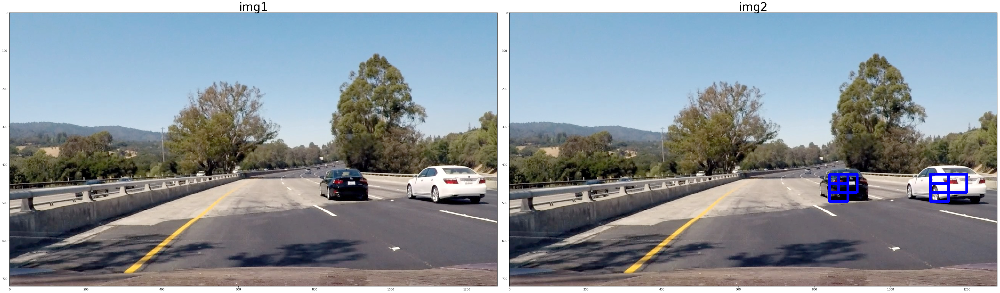

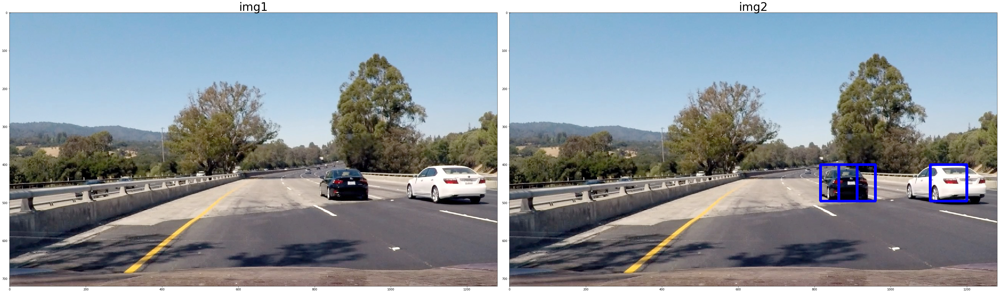

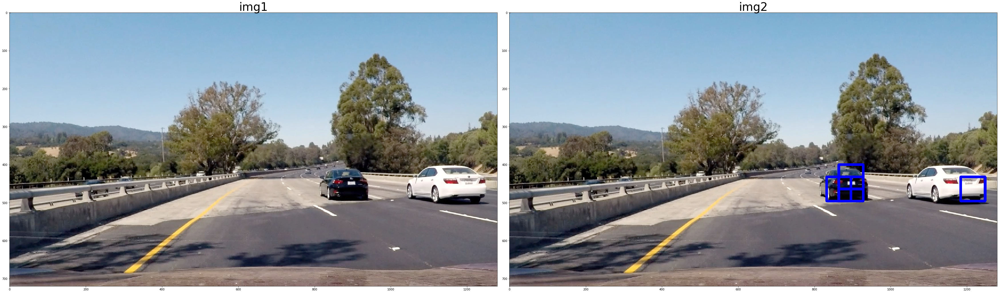

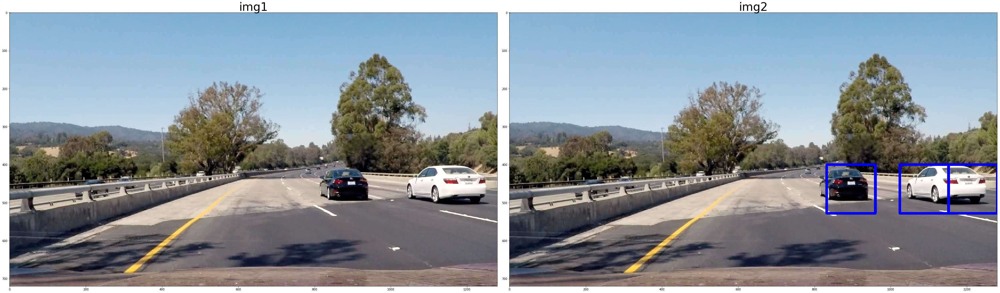

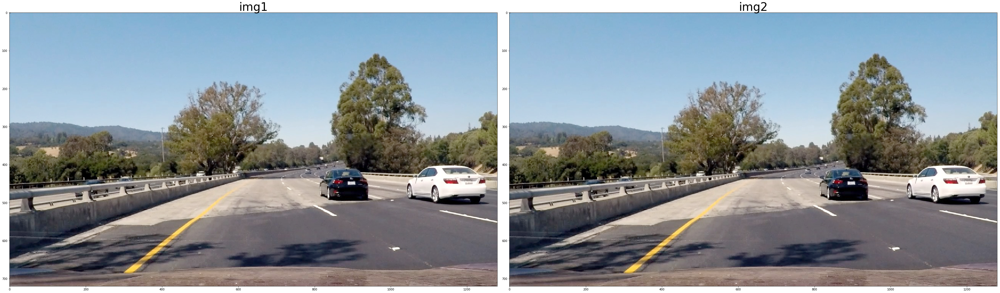

In [59]:
rects = []
image = mpimg.imread('test_images/test4.jpg')
image = exposure.adjust_gamma(image, 0.8)
orient = 16
pix_per_cell = 16
cell_per_block = 2

scale = 0.75
ystart = 425
ystop = 500
boxes, rectangles = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
compare_images(image, boxes, text1 = 'img1', text2 = 'img2')
rects.append(rectangles)

ystart = 400
ystop = 650
scale = 1.5
boxes, rectangles = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
compare_images(image, boxes, text1 = 'img1', text2 = 'img2')
rects.append(rectangles)

scale = 1.0
ystart = 400
ystop = 650
boxes, rectangles = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
compare_images(image, boxes, text1 = 'img1', text2 = 'img2')
rects.append(rectangles)



scale = 2
ystart = 400
ystop = 650
boxes, rectangles = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
compare_images(image, boxes, text1 = 'img1', text2 = 'img2')
rects.append(rectangles)

scale = 3
ystart = 450
ystop = 450 + 3*65
boxes, rectangles = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
compare_images(image, boxes, text1 = 'img1', text2 = 'img2')
rects.append(rectangles)




In [51]:
"""class Vehicle_Detect():
    def __init__(self):
        # history of rectangles previous n frames
        self.prev_rects = [] 
        
    def add_rects(self, rects):
        for i in rects:
            for j in i:
                self.prev_rects.append(j)
        if len(self.prev_rects) > 12:
            # throw out oldest rectangle set(s)
            self.prev_rects = self.prev_rects[len(self.prev_rects)-12:]"""
class Vehicle_Detect():
    def __init__(self):
        # privious rects after labels
        self.prev_rects = np.zeros((720,1280))
        self.rects = []
    
    
    def add_rects(self, rects):
        #add rects after labels i.e. after threshhold (use if to reduce noise of next frame)
        self.prev_rects = rects
    #keep history of last 10frames (assuming in around 30fps video traffic won't substantiably chainge in 10 frames)
    def add_current_rects(self, rects):
        self.rects.append(rects)
        if len(self.rects) > 10:
            self.rects = self.rects[len(self.rects)-10:]

In [52]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    rects1 = []
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
        print ('loop: ', bbox)
        rects1.append([bbox[0], bbox[1]])
    # Return the image
    return img, rects1

In [60]:
r1 = Vehicle_Detect()

[[[[(840, 425), (888, 473)], [(840, 449), (888, 497)], [(864, 425), (912, 473)], [(1104, 425), (1152, 473)], [(1104, 449), (1152, 497)], [(1152, 425), (1200, 473)]], [[(816, 400), (912, 496)], [(864, 400), (960, 496)], [(1104, 400), (1200, 496)]], [[(832, 432), (896, 496)], [(864, 400), (928, 464)], [(864, 432), (928, 496)], [(1184, 432), (1248, 496)]], [[(832, 400), (960, 528)], [(1024, 400), (1152, 528)], [(1152, 400), (1280, 528)]], []], [[[(840, 425), (888, 473)], [(840, 449), (888, 497)], [(864, 425), (912, 473)], [(1104, 425), (1152, 473)], [(1104, 449), (1152, 497)], [(1152, 425), (1200, 473)]], [[(816, 400), (912, 496)], [(864, 400), (960, 496)], [(1104, 400), (1200, 496)]], [[(832, 432), (896, 496)], [(864, 400), (928, 464)], [(864, 432), (928, 496)], [(1184, 432), (1248, 496)]], [[(832, 400), (960, 528)], [(1024, 400), (1152, 528)], [(1152, 400), (1280, 528)]], []], [[[(840, 425), (888, 473)], [(840, 449), (888, 497)], [(864, 425), (912, 473)], [(1104, 425), (1152, 473)], [(1

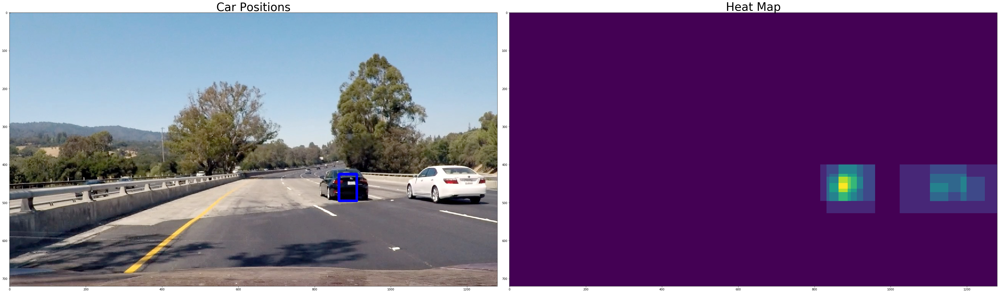

In [66]:
from scipy.ndimage.measurements import label

r1.add_current_rects(rects)
#print (r1.rects)
recs = []
print (r1.rects)
for rec in r1.rects:
    for i in rec:
        for j in i:
            #print (j)
            recs.append(j)
#print ("\n hola: ", (recs))

"""for i in r1.rects:
    for j in i:
        recs.append(j)
        
print ('hello: ', (recs))"""


heat = np.zeros_like(image[:,:,1]).astype(np.float)

print ("heat", recs)
heat = add_heat(heat, recs)
heat1 = np.clip(heat, 0, 255)

pri_thresh_labels = label(heat1)
heatmap = apply_threshold(heat1, (len(recs)//3 -2))
labels = label(heatmap)

binary_labels = np.where(labels[0]!=0, 1,0)
priv_binary_labeles = np.where(r1.prev_rects!=0, 1,0)
x = (binary_labels&priv_binary_labeles)
l = label(x)
r1.add_rects(labels[0])
#===============

draw_img, rectos = draw_labeled_bboxes(np.copy(image), l)
#r1.add_current_rects(rectos)
#print ('present: ', rectos)
#================
#draw_img = draw_labeled_bboxes(np.copy(image), labels)
#print ('past:', r1.rects)


compare_images(draw_img, heat, text1 = 'Car Positions', text2 = 'Heat Map')

In [ ]:
#heatmap = []
recF1 = Vehicle_Detect()
def process_image(image):
    rects = []
    image = exposure.adjust_gamma(image, 0.8)
    image = cv2.resize(image, (1280, 720))

    scale = 0.75
    ystart = 390
    ystop = 425
    rectangles = find_cars1(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
    compare_images(image, boxes, text1 = 'img1', text2 = 'img2')
    rects.append(rectangles)

    ystart = 400
    ystop = 650
    scale = 1.5
    rectangles = find_cars1(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
    #compare_images(image, boxes, text1 = 'img1', text2 = 'img2')
    rects.append(rectangles)

    scale = 1.0
    ystart = 400
    ystop = 650
    rectangles = find_cars1(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
    #compare_images(image, boxes, text1 = 'img1', text2 = 'img2')
    rects.append(rectangles)

    scale = 2
    ystart = 450
    ystop = 650
    #rectangles = find_cars1(image, ystart, ystop, scale, svc, X_scaler, orient = 9, pix_per_cell = 8, cell_per_block = 2, spatial_size = (32, 32), hist_bins=32)
    #compare_images(image, boxes, text1 = 'img1', text2 = 'img2')
    #rects.append(rectangles)

    scale = 2
    ystart = 400
    ystop = 600
    rectangles = find_cars1(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
    #compare_images(image, boxes, text1 = 'img1', text2 = 'img2')
    rects.append(rectangles)

    scale = 3
    ystart = 450
    ystop = 450 + 3*65
    #rectangles = find_cars1(image, ystart, ystop, scale, svc, X_scaler, orient = 9, pix_per_cell = 8, cell_per_block = 2, spatial_size = (32, 32), hist_bins=32)
    #compare_images(image, boxes, text1 = 'img1', text2 = 'img2')
    #rects.append(rectangles)
    
    recF1.add_current_rects(rects)
    
    recs = []
    """    for i in rects:
        for j in i:
            #print (j)
            recs.append(j)
    
    for i in recF1.rects:
        for j in i:
            recs.append(j)"""
    
    for rec in recF1.rects:
        for i in rec:
            for j in i:
                #print (j)
                recs.append(j)
    
    """recF1.add_rects(rects)
    heat = np.zeros_like(image[:,:,1]).astype(np.float)
    heat = add_heat(heat, recF1.prev_rects)
    #labels0.add_heatmap(heat)
    #h1 = (heat * labels0.priv_heatmap())
    heatmap = apply_threshold(heat, len(recF1.prev_rects)//3)

    #heatmap = apply_threshold(heat, 2) 
    labels = label(heatmap)
    
    #l1 = labels[0] & labels1.priv_heatmap()
    #labels1.add_heatmap(labels[0])
    draw_img = draw_labeled_bboxes(np.copy(image), labels)"""
    
    heat = np.zeros_like(image[:,:,1]).astype(np.float)
    heat = add_heat(heat, recs)
    #heat = np.clip(heat, 0, 255)

    heatmap = apply_threshold(heat, len(recs)//3)
    labels = label(heatmap)

    binary_labels = np.where(labels[0]!=0, 1,0)
    priv_binary_labeles = np.where(recF1.prev_rects!=0, 1,0)
    x = (binary_labels&priv_binary_labeles)
    l = label(x)
    recF1.add_rects(labels[0])
    #===============

    draw_img, rectos = draw_labeled_bboxes(np.copy(image), l)
    #recF1.add_current_rects(rectos)
    return draw_img
        
white_output = '2demo_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a 2 of the first 5 seconds test_video

clip2 = VideoFileClip("project_video.mp4").subclip(0,10)
#clip2 = VideoFileClip("test_video.mp4")
white_clip = clip2.fl_image(process_image) #NOTE: this function expectscolor images!!
%time white_clip.write_videofile(white_output, audio=False)
